# 01 — Data Preparation Pipeline (v3)

## Đề tài
**Phân biệt loại quả & trạng thái tươi/hỏng bằng Deep Learning (CNN)**

Bài toán **multi-class image classification** với **16 lớp** = 8 loại quả × 2 trạng thái (Fresh/Rotten):
Apple, Banana, Bellpepper, Guava, Lime, Orange, Pomegranate, Tomato.

## Mục tiêu notebook
Notebook này là **giai đoạn 1–2** trong pipeline 6 giai đoạn của đồ án — chuẩn bị dữ liệu sạch, chuẩn hoá, có visualization đầy đủ làm input cho bước training (notebook `02_train_v3.ipynb`).

## Pipeline tổng thể

```
  ┌─────────────────┐      ┌─────────────────┐      ┌─────────────────┐
  │ 1. CRAWLING     │─────▶│ 2. CLEANING     │─────▶│ 3. EDA          │
  │  Multi-engine   │      │  Dedup + Broken │      │  Class balance  │
  │  Bing + Baidu + │      │  Tiny + Blurry  │      │  Size + Format  │
  │  DDG + Google   │      │  filter         │      │  Heatmaps       │
  └─────────────────┘      └─────────────────┘      └─────────────────┘
                                                              │
                                                              ▼
  ┌─────────────────┐      ┌─────────────────┐      ┌─────────────────┐
  │ 6. SPLIT        │◀─────│ 5. FEATURES     │◀─────│ 4. PREPROCESS   │
  │  Train/Val/Test │      │  HSV + PCA      │      │  Resize 224×224 │
  │  70 / 15 / 15   │      │  + t-SNE        │      │  RGB + Normalize│
  └─────────────────┘      └─────────────────┘      └─────────────────┘
                                                              │
                                                              ▼
                                              [Notebook 02 — Training]
```

## Cấu trúc notebook

| # | Section | Output chính |
|---|---|---|
| 1 | Setup & Dataset Scan | `metadata.csv`, DataFrame `df` |
| 2 | Class Balance | 4 plots (Fresh/Rotten, 16-class, per-fruit, heatmap) |
| 3 | Image Size Distribution | 4 plots (histogram, scatter, boxplot, stats table) |
| 4 | File Format Distribution | 2 plots (bar/pie, format × class) |
| 5 | Sample Image Grid | 16 ảnh đại diện 16 class |
| 6 | Image Quality & Cleaning | Blur detection, duplicate scan, cleaning report |
| 7 | Preprocessing Pipeline | Original → Resize → Normalize visualization |
| 8 | Data Augmentation | 8 ảnh sau augmentation (rotate/flip/zoom/...) |
| 9 | Feature Engineering | HSV 512-d + StandardScaler |
| 10 | Dimensionality Reduction | PCA + t-SNE (2D scatter) |
| 11 | Final Dataset Summary | Bảng tổng hợp + Train/Val/Test split |

## Yêu cầu đề bài đáp ứng được
- ✅ **>10.000 mẫu** tự crawl (multi-source: Bing + Baidu + DuckDuckGo + Google)
- ✅ **Thống kê mô tả trực quan** đầy đủ (Section 2-4)
- ✅ **Lựa chọn đặc trưng + làm sạch + chuẩn hoá + giảm chiều** (Section 6-10)
- ✅ **Trực quan hoá kết quả từng bước** (mỗi bước xuất `results/eda_*.png`)

## 1. Setup & Dataset Scan

### 1.1 Crawling Pipeline (đã thực hiện qua scripts)

Dataset được thu thập từ **4 nguồn search engine** để đảm bảo đa dạng và tránh bias từ một nguồn duy nhất:

| Engine | Module | Ưu điểm |
|---|---|---|
| Bing Images | `crawl_images.py` (icrawler) | Index rộng, ổn định, ít block |
| Baidu Images | `crawl_images.py` (icrawler) | Coverage tốt cho ảnh châu Á |
| DuckDuckGo | `ddg_crawler.py` | Privacy-friendly, không yêu cầu API key |
| Google Images | `crawl_images.py` (icrawler) | Quality cao, fallback nếu các engine khác thiếu |

**Tại sao multi-engine?** Mỗi search engine có thuật toán index khác nhau → kết quả crawl trùng nhau ít hơn 30% → tăng diversity của dataset, model tránh overfit theo style ảnh của một nguồn cụ thể (ví dụ: ảnh có watermark Google).

**Keyword strategy**: 41 keyword đa dạng (Anh + Việt + tên loại quả cụ thể) cho mỗi class. Ví dụ class `Apple_Rotten` được crawl bằng: `"rotten apple"`, `"moldy apple"`, `"táo hỏng"`, `"apple decay close-up"`...

**Cleaning đã làm trong crawler** (`crawler/crawl_images.py::clean_directory`):
1. **Broken image filter**: thử open bằng `PIL.Image.verify()` — file lỗi bị xoá.
2. **Tiny image filter**: bỏ ảnh có `min(W, H) < 64 px` (icon, thumbnail không đủ thông tin).
3. **Perceptual hash deduplication**: dùng `imagehash.phash()` 64-bit để loại bỏ ảnh trùng/gần trùng.

### 1.2 Tại sao Perceptual Hash thay vì so sánh filename?

**Filename match** chỉ phát hiện ảnh có tên giống nhau — vô dụng vì các engine đặt tên ngẫu nhiên.

**MD5/SHA hash** so sánh byte-by-byte → 1 pixel khác cũng không match → không phát hiện được ảnh resize, ảnh recompress.

**Perceptual hash (pHash)**:
- Resize ảnh về 32×32 grayscale, áp DCT (Discrete Cosine Transform)
- Lấy 8×8 = 64 bit từ low-frequency coefficients
- Hash giống nhau khi nội dung ảnh tương đồng (kể cả resize, recompress, watermark nhẹ)
- **Hamming distance** giữa 2 hash < 5 ⇒ duplicate

→ pHash phát hiện cả ảnh giống nhau bị Bing crop khác Baidu crop, trong khi byte hash sẽ miss.

### 1.3 Setup & Imports

In [1]:
from pathlib import Path
import os
import sys

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm.auto import tqdm

sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams['figure.dpi'] = 110
plt.rcParams['savefig.dpi'] = 130
plt.rcParams['axes.titleweight'] = 'bold'

# Đảm bảo CWD là thư mục project (notebook nằm trong project/notebook/)
PROJECT_DIR = Path.cwd()
if PROJECT_DIR.name == 'notebook':
    PROJECT_DIR = PROJECT_DIR.parent
os.chdir(PROJECT_DIR)

RAW_DIR = PROJECT_DIR / 'dataset' / 'raw'
RESULTS_DIR = PROJECT_DIR / 'results'
RESULTS_DIR.mkdir(exist_ok=True)

print(f'PROJECT_DIR : {PROJECT_DIR}')
print(f'RAW_DIR     : {RAW_DIR}  (exists={RAW_DIR.exists()})')
print(f'RESULTS_DIR : {RESULTS_DIR}')

PROJECT_DIR : d:\Khoa học dữ liệu\project
RAW_DIR     : d:\Khoa học dữ liệu\project\dataset\raw  (exists=True)
RESULTS_DIR : d:\Khoa học dữ liệu\project\results


c:\Users\nvant\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Quét toàn bộ ảnh -> DataFrame metadata (class, fruit, status, format, width, height)
IMG_EXT = {'.jpg', '.jpeg', '.png', '.webp', '.bmp', '.gif'}

records = []
class_dirs = sorted([d for d in RAW_DIR.iterdir() if d.is_dir()])

for cls_dir in tqdm(class_dirs, desc='Quét class'):
    fruit, status = cls_dir.name.rsplit('_', 1)
    files = [f for f in cls_dir.iterdir() if f.is_file() and f.suffix.lower() in IMG_EXT]
    for f in tqdm(files, desc=cls_dir.name, leave=False):
        try:
            with Image.open(f) as im:
                w, h = im.size
                mode = im.mode
        except Exception:
            w, h, mode = None, None, None
        records.append({
            'path': str(f),
            'class': cls_dir.name,
            'fruit': fruit,
            'status': status,
            'format': f.suffix.lower().lstrip('.'),
            'width': w,
            'height': h,
            'mode': mode,
            'size_kb': f.stat().st_size / 1024,
        })

df = pd.DataFrame(records)
print(f'Tổng số ảnh: {len(df):,}')
print(f'Số ảnh lỗi (không đọc được kích thước): {df.width.isna().sum():,}')
df.head()

Quét class: 100%|██████████| 16/16 [00:16<00:00,  1.06s/it]


Tổng số ảnh: 12,786
Số ảnh lỗi (không đọc được kích thước): 0


,path,class,fruit,status,format,width,height,mode,size_kb
0,d:\Khoa học dữ liệu\project\dataset\raw\Apple_...,Apple_Fresh,Apple,Fresh,jpg,1500,1101,RGB,380.582031
1,d:\Khoa học dữ liệu\project\dataset\raw\Apple_...,Apple_Fresh,Apple,Fresh,jpg,1500,1100,RGB,248.199219
2,d:\Khoa học dữ liệu\project\dataset\raw\Apple_...,Apple_Fresh,Apple,Fresh,jpg,1500,1101,RGB,327.416016
3,d:\Khoa học dữ liệu\project\dataset\raw\Apple_...,Apple_Fresh,Apple,Fresh,jpg,1500,1096,RGB,444.101562
4,d:\Khoa học dữ liệu\project\dataset\raw\Apple_...,Apple_Fresh,Apple,Fresh,jpg,1500,945,RGB,340.458008


In [3]:
# Lưu metadata để dùng lại cho các bước sau (không phải scan lại)
META_CSV = RESULTS_DIR / 'eda_metadata.csv'
df.to_csv(META_CSV, index=False)
print(f'Đã lưu metadata -> {META_CSV}')

Đã lưu metadata -> d:\Khoa học dữ liệu\project\results\eda_metadata.csv


## 2. Class Balance Analysis

**Mục đích**: kiểm tra dataset có bị **class imbalance** hay không — yếu tố then chốt quyết định:
- Có cần dùng `class_weight` hay oversampling khi train?
- Metric đánh giá phù hợp (accuracy thuần hay macro-F1)?
- Khả năng model học các class thiểu số.

**Quy ước đánh giá**:
- **Imbalance ratio** = `max_count / min_count`
- < 1.5 → balanced (lý tưởng cho `accuracy` metric)
- 1.5–3 → slight imbalance (chấp nhận được, dùng macro-F1 để check fairness)
- \> 3 → heavy imbalance (cần class_weight hoặc resampling)

**4 góc nhìn được phân tích:**
- **2.1** Tổng quan Fresh vs Rotten (binary view).
- **2.2** 16 class chi tiết (Fruit × Status), sắp xếp tăng dần.
- **2.3** Stacked bar — Fresh/Rotten cho từng loại quả.
- **2.4** Heatmap Fruit × Status.

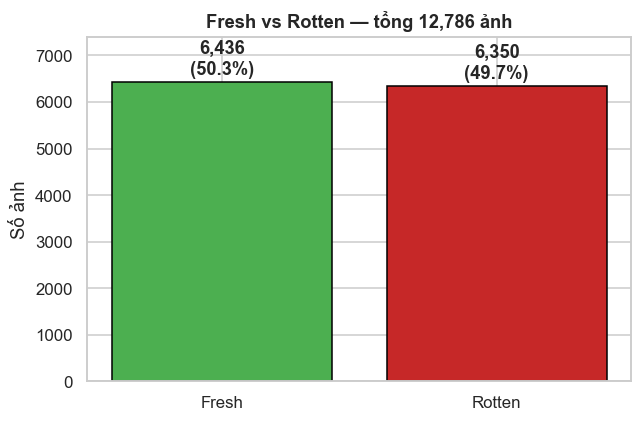

In [4]:
# 2.1 - Fresh vs Rotten tổng thể
status_counts = df['status'].value_counts().sort_index()
total = status_counts.sum()

fig, ax = plt.subplots(figsize=(6, 4))
colors = {'Fresh': '#4caf50', 'Rotten': '#c62828'}
bars = ax.bar(status_counts.index, status_counts.values,
              color=[colors[s] for s in status_counts.index], edgecolor='black')
for b, v in zip(bars, status_counts.values):
    ax.text(b.get_x() + b.get_width()/2, v + total*0.005,
            f'{v:,}\n({v/total*100:.1f}%)', ha='center', va='bottom', fontweight='bold')
ax.set_title(f'Fresh vs Rotten — tổng {total:,} ảnh')
ax.set_ylabel('Số ảnh')
ax.set_ylim(0, status_counts.max() * 1.15)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_balance_fresh_vs_rotten.png', bbox_inches='tight')
plt.show()

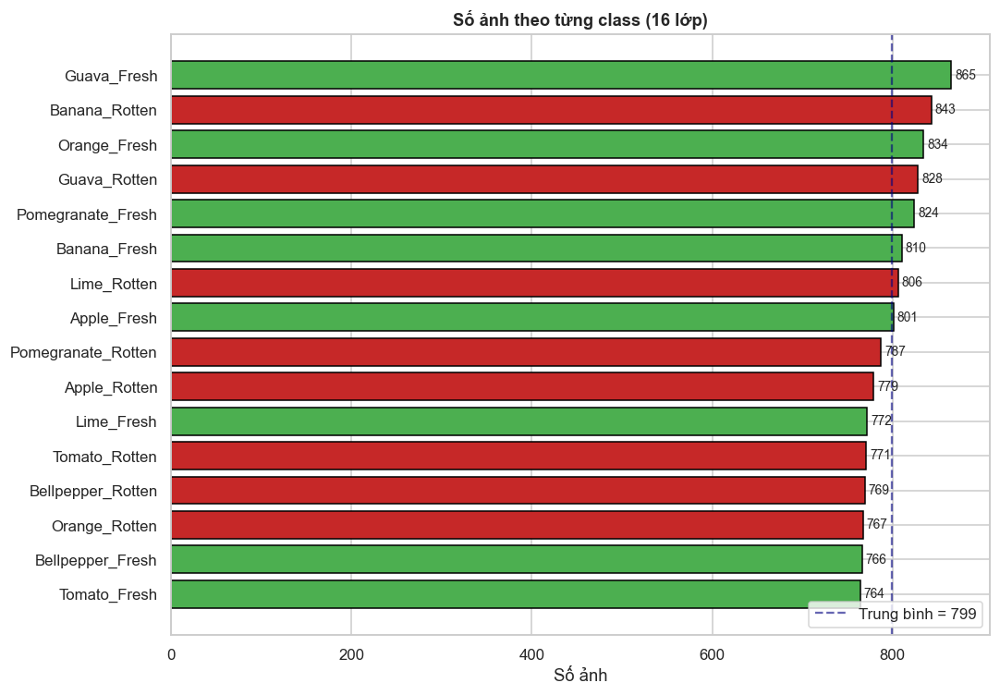

Min: 764  Max: 865  Std: 32.1  Tỉ lệ Max/Min: 1.13


In [5]:
# 2.2 - 16 class chi tiết (sắp xếp tăng dần)
class_counts = df['class'].value_counts().sort_values()

fig, ax = plt.subplots(figsize=(10, 7))
bar_colors = ['#4caf50' if c.endswith('_Fresh') else '#c62828' for c in class_counts.index]
bars = ax.barh(class_counts.index, class_counts.values, color=bar_colors, edgecolor='black')
for b, v in zip(bars, class_counts.values):
    ax.text(v + class_counts.max()*0.005, b.get_y() + b.get_height()/2,
            f'{v:,}', va='center', fontsize=9)
ax.set_title('Số ảnh theo từng class (16 lớp)')
ax.set_xlabel('Số ảnh')
ax.axvline(class_counts.mean(), color='navy', ls='--', alpha=0.6,
           label=f'Trung bình = {class_counts.mean():.0f}')
ax.legend(loc='lower right')
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_balance_16class.png', bbox_inches='tight')
plt.show()

print(f'Min: {class_counts.min():,}  Max: {class_counts.max():,}  '
      f'Std: {class_counts.std():.1f}  Tỉ lệ Max/Min: {class_counts.max()/class_counts.min():.2f}')

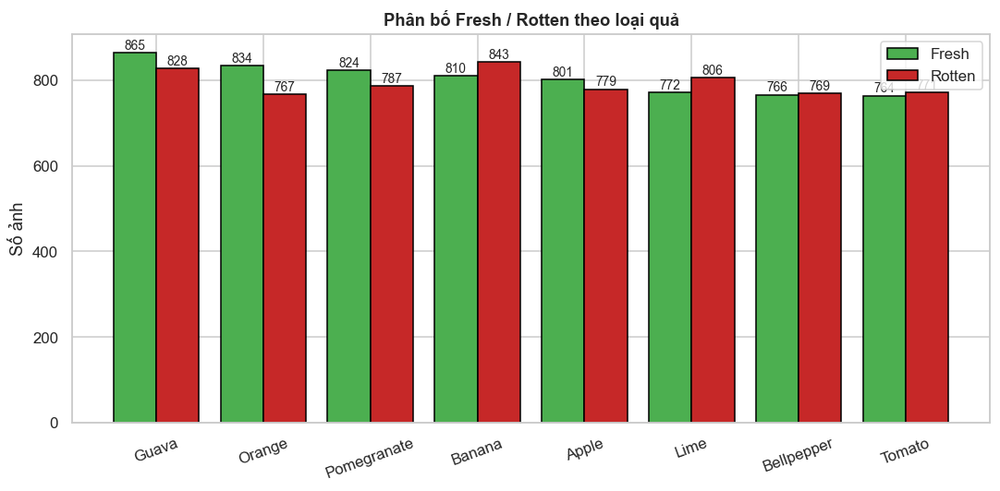

status,Fresh,Rotten,Total,Ratio
fruit,,,,
Guava,865,828,1693,1.044686
Orange,834,767,1601,1.087353
Pomegranate,824,787,1611,1.047014
Banana,810,843,1653,0.960854
Apple,801,779,1580,1.028241
Lime,772,806,1578,0.957816
Bellpepper,766,769,1535,0.996099
Tomato,764,771,1535,0.990921


In [6]:
# 2.3 - Stacked bar: Fresh/Rotten theo từng loại quả
pivot = df.pivot_table(index='fruit', columns='status', values='path', aggfunc='count').fillna(0)
pivot = pivot[['Fresh', 'Rotten']].sort_values('Fresh', ascending=False)

fig, ax = plt.subplots(figsize=(10, 5))
x = np.arange(len(pivot))
w = 0.4
ax.bar(x - w/2, pivot['Fresh'],  w, label='Fresh',  color='#4caf50', edgecolor='black')
ax.bar(x + w/2, pivot['Rotten'], w, label='Rotten', color='#c62828', edgecolor='black')
for i, fruit in enumerate(pivot.index):
    ax.text(i - w/2, pivot.loc[fruit,'Fresh']  + 8, f"{int(pivot.loc[fruit,'Fresh'])}",  ha='center', fontsize=9)
    ax.text(i + w/2, pivot.loc[fruit,'Rotten'] + 8, f"{int(pivot.loc[fruit,'Rotten'])}", ha='center', fontsize=9)
ax.set_xticks(x)
ax.set_xticklabels(pivot.index, rotation=20)
ax.set_ylabel('Số ảnh')
ax.set_title('Phân bố Fresh / Rotten theo loại quả')
ax.legend()
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_balance_per_fruit.png', bbox_inches='tight')
plt.show()

pivot.assign(Total=pivot.sum(axis=1), Ratio=lambda d: d['Fresh']/d['Rotten'])

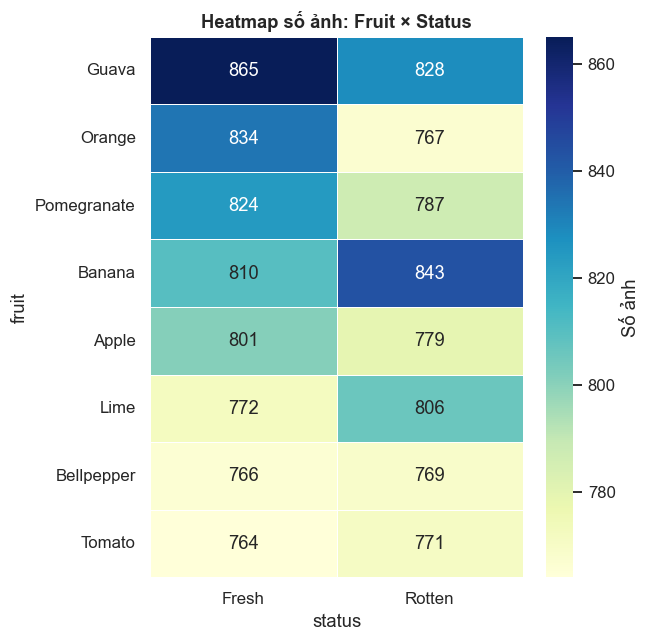

In [7]:
# 2.4 - Heatmap Fruit x Status
fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(pivot[['Fresh','Rotten']].astype(int), annot=True, fmt='d',
            cmap='YlGnBu', linewidths=.5, cbar_kws={'label':'Số ảnh'}, ax=ax)
ax.set_title('Heatmap số ảnh: Fruit × Status')
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_heatmap_fruit_status.png', bbox_inches='tight')
plt.show()

## 3. Phân bố kích thước ảnh

- **3.1** Histogram của Width và Height.
- **3.2** Scatter Width × Height (cho thấy aspect-ratio + cluster phổ biến).
- **3.3** Boxplot kích thước theo class (phát hiện class có ảnh quá nhỏ/lớn).
- **3.4** Bảng thống kê: min / mean / median / max + tỷ lệ ảnh < 224 px (cần resize).

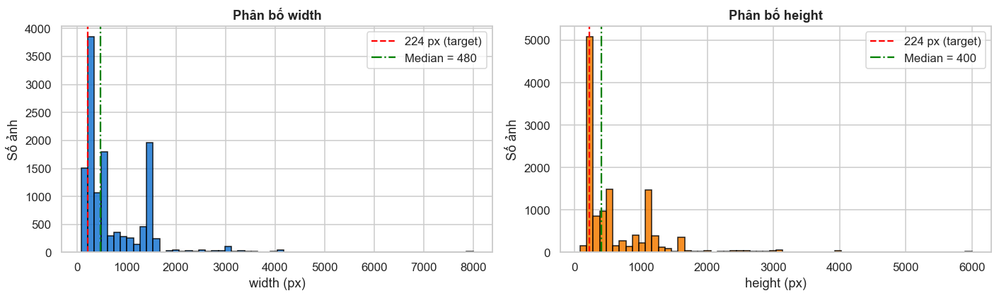

In [8]:
# 3.1 - Histogram width/height
df_sz = df.dropna(subset=['width', 'height']).copy()
df_sz['width']  = df_sz['width'].astype(int)
df_sz['height'] = df_sz['height'].astype(int)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
for ax, col, color in zip(axes, ['width', 'height'], ['#1976d2', '#f57c00']):
    ax.hist(df_sz[col], bins=60, color=color, edgecolor='black', alpha=0.85)
    ax.axvline(224, color='red', ls='--', label='224 px (target)')
    ax.axvline(df_sz[col].median(), color='green', ls='-.',
               label=f'Median = {df_sz[col].median():.0f}')
    ax.set_title(f'Phân bố {col}')
    ax.set_xlabel(f'{col} (px)')
    ax.set_ylabel('Số ảnh')
    ax.legend()
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_size_hist.png', bbox_inches='tight')
plt.show()

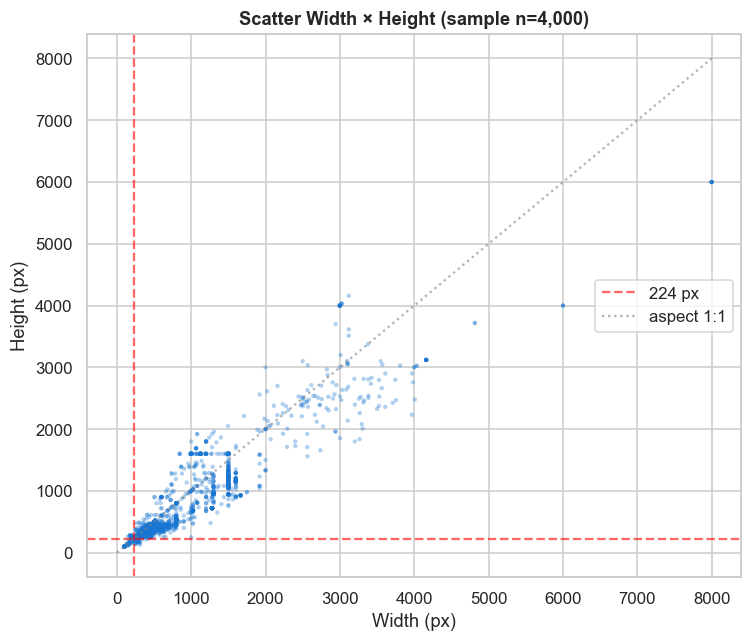

In [9]:
# 3.2 - Scatter Width x Height (lấy mẫu để vẽ nhanh nếu quá nhiều)
sample = df_sz.sample(min(4000, len(df_sz)), random_state=42)
fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(sample['width'], sample['height'], s=8, alpha=0.35, c='#1976d2', edgecolors='none')
ax.axvline(224, color='red', ls='--', alpha=0.6)
ax.axhline(224, color='red', ls='--', alpha=0.6, label='224 px')
lim = max(sample['width'].max(), sample['height'].max())
ax.plot([0, lim], [0, lim], color='gray', ls=':', alpha=0.6, label='aspect 1:1')
ax.set_xlabel('Width (px)'); ax.set_ylabel('Height (px)')
ax.set_title(f'Scatter Width × Height (sample n={len(sample):,})')
ax.legend()
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_size_scatter.png', bbox_inches='tight')
plt.show()

C:\Users\nvant\AppData\Local\Temp\ipykernel_7712\2044389981.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_sz, x='class', y='min_side', order=order, ax=ax,
C:\Users\nvant\AppData\Local\Temp\ipykernel_7712\2044389981.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=70, fontsize=8)


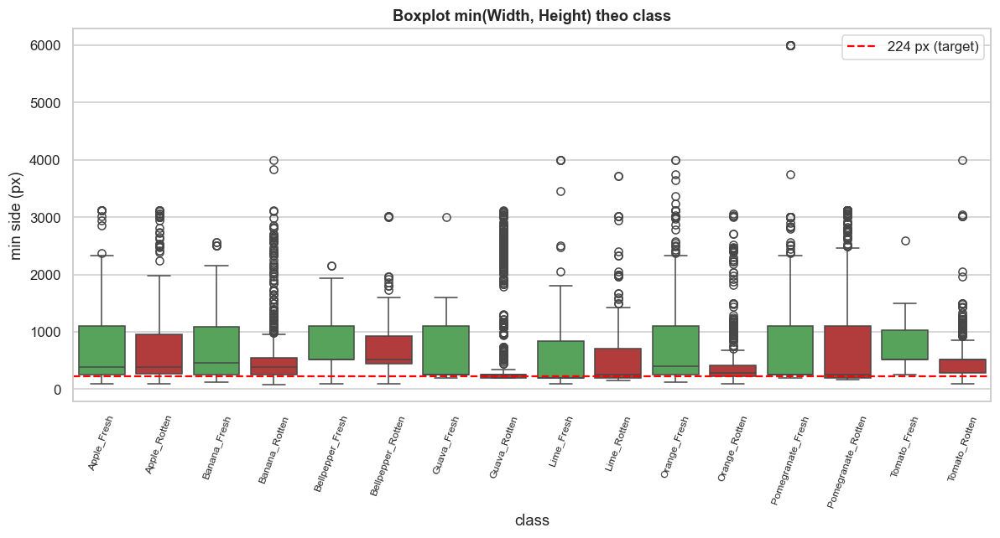

In [10]:
# 3.3 - Boxplot kích thước (min(W,H)) theo class
df_sz['min_side'] = df_sz[['width','height']].min(axis=1)
order = sorted(df_sz['class'].unique())
fig, ax = plt.subplots(figsize=(11, 6))
sns.boxplot(data=df_sz, x='class', y='min_side', order=order, ax=ax,
            palette=['#4caf50' if c.endswith('_Fresh') else '#c62828' for c in order])
ax.axhline(224, color='red', ls='--', label='224 px (target)')
ax.set_title('Boxplot min(Width, Height) theo class')
ax.set_ylabel('min side (px)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=70, fontsize=8)
ax.legend()
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_size_box_per_class.png', bbox_inches='tight')
plt.show()

In [11]:
# 3.4 - Bảng thống kê tổng hợp về kích thước
stats = df_sz[['width','height','min_side','size_kb']].describe(
    percentiles=[.05,.25,.5,.75,.95]
).T[['min','5%','25%','50%','75%','95%','max','mean','std']]
print('Thống kê kích thước & dung lượng:')
display(stats.round(1))

n_small = (df_sz['min_side'] < 224).sum()
n_total = len(df_sz)
print(f"\nẢnh có min(W,H) < 224 px: {n_small:,}/{n_total:,} ({n_small/n_total*100:.2f}%)")
print(f"Aspect ratio (W/H) — median={df_sz.eval('width/height').median():.2f}, "
      f"std={df_sz.eval('width/height').std():.2f}")

Thống kê kích thước & dung lượng:


,min,5%,25%,50%,75%,95%,max,mean,std
width,90.0,192.0,256.0,480.0,1280.0,1600.0,8000.0,749.3,747.8
height,80.0,192.0,256.0,400.0,997.0,1600.0,6000.0,650.5,628.9
min_side,80.0,192.0,256.0,396.0,957.0,1481.0,6000.0,618.2,588.1
size_kb,1.6,6.6,16.8,23.4,156.0,1528.2,17033.9,253.7,667.6



Ảnh có min(W,H) < 224 px: 2,220/12,786 (17.36%)
Aspect ratio (W/H) — median=1.00, std=0.28


## 4. Phân bố định dạng ảnh

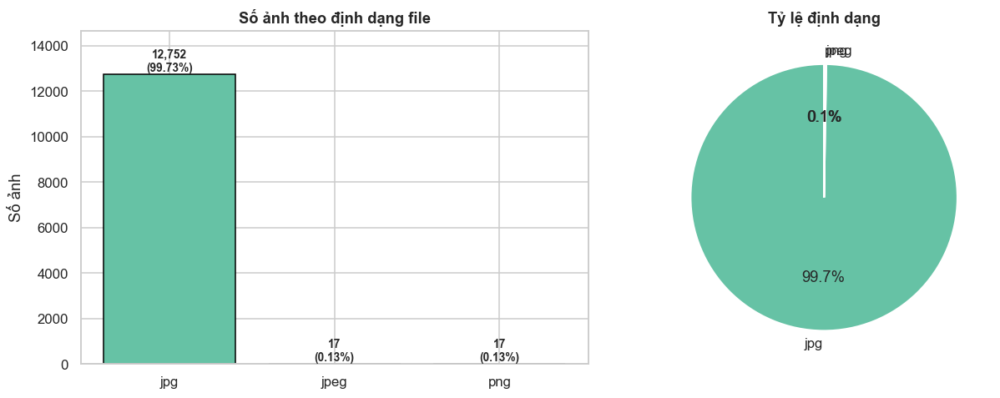

,count,pct
format,,
jpg,12752,99.73
jpeg,17,0.13
png,17,0.13


In [12]:
# 4.1 - Bar + pie cho định dạng file
fmt_counts = df['format'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))

ax = axes[0]
bars = ax.bar(fmt_counts.index, fmt_counts.values, color=sns.color_palette('Set2', len(fmt_counts)),
              edgecolor='black')
for b, v in zip(bars, fmt_counts.values):
    ax.text(b.get_x()+b.get_width()/2, v + fmt_counts.max()*0.01,
            f'{v:,}\n({v/len(df)*100:.2f}%)', ha='center', fontsize=9, fontweight='bold')
ax.set_title('Số ảnh theo định dạng file')
ax.set_ylabel('Số ảnh')
ax.set_ylim(0, fmt_counts.max()*1.15)

ax = axes[1]
ax.pie(fmt_counts.values, labels=fmt_counts.index, autopct='%1.1f%%',
       colors=sns.color_palette('Set2', len(fmt_counts)),
       wedgeprops={'edgecolor':'white','linewidth':1.5}, startangle=90)
ax.set_title('Tỷ lệ định dạng')

plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_format_distribution.png', bbox_inches='tight')
plt.show()

fmt_counts.to_frame('count').assign(pct=lambda d: (d['count']/len(df)*100).round(2))

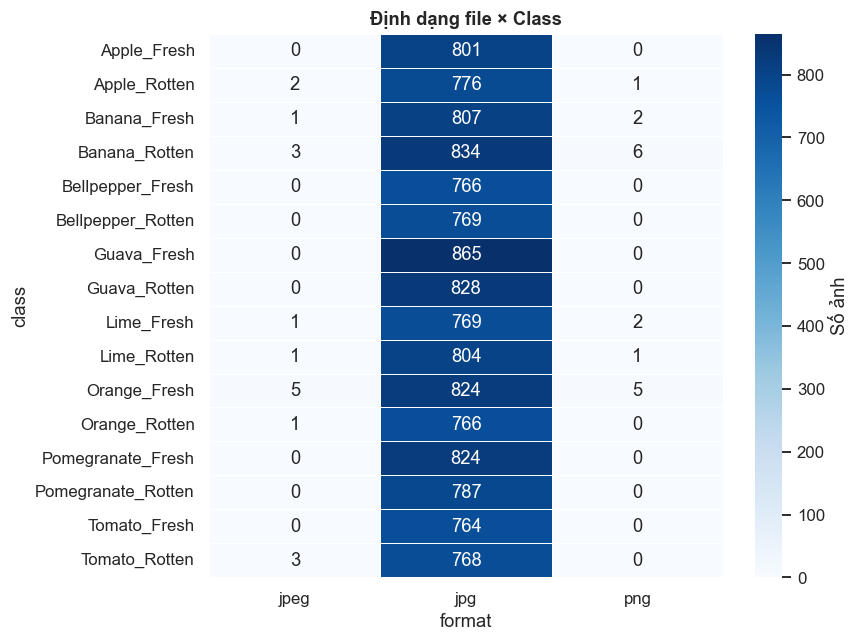

In [13]:
# 4.2 - Định dạng theo class (heatmap để thấy class nào có format lạ)
fmt_by_cls = df.pivot_table(index='class', columns='format', values='path',
                            aggfunc='count', fill_value=0).astype(int)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(fmt_by_cls, annot=True, fmt='d', cmap='Blues',
            linewidths=.5, cbar_kws={'label':'Số ảnh'}, ax=ax)
ax.set_title('Định dạng file × Class')
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_format_by_class.png', bbox_inches='tight')
plt.show()

## 5. Sample Image Grid — trực quan từng class

**Mục đích**: hiển thị ảnh đại diện 16 class để:
- Người đọc báo cáo hình dung **bài toán đang giải quyết là gì**.
- Phát hiện sớm các vấn đề: ảnh chứa watermark, ảnh đồ hoạ thay vì ảnh thật, ảnh sai class.
- Đối chiếu trực quan giữa Fresh vs Rotten cùng 1 loại quả → đặc trưng nhận biết là gì.

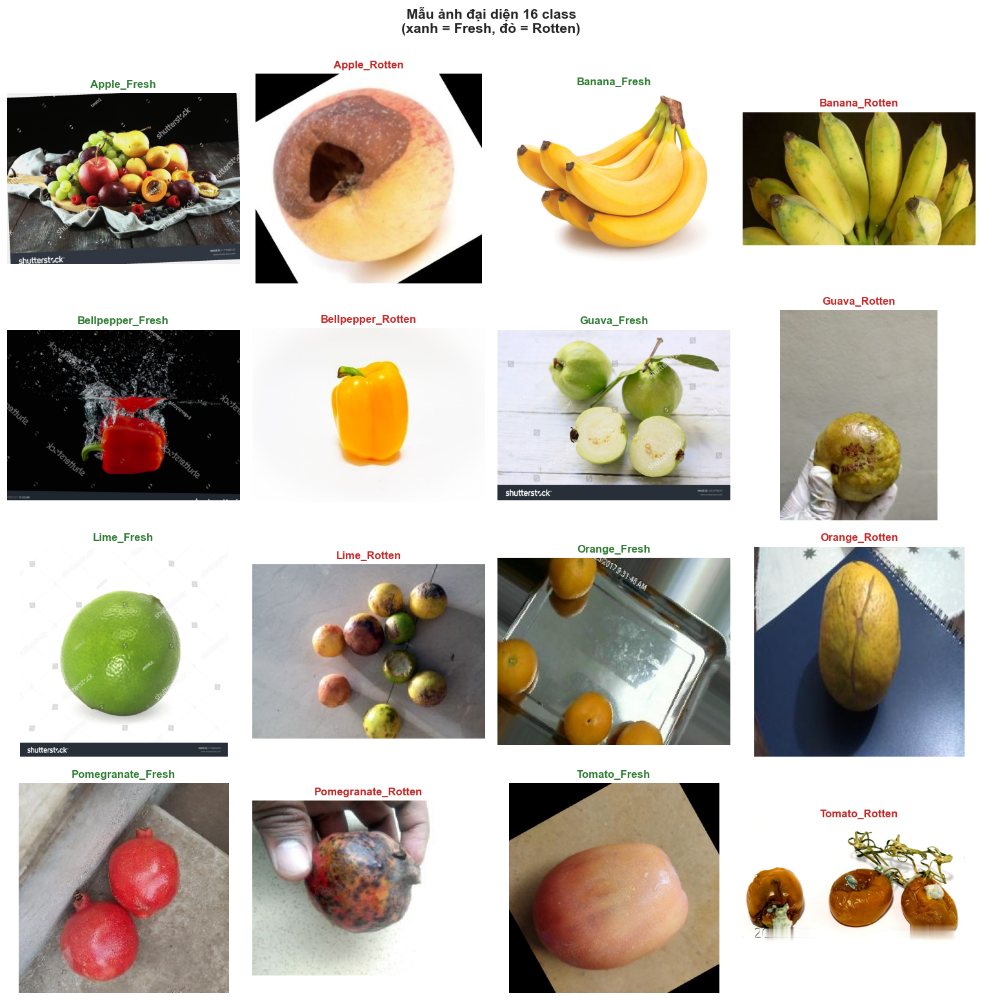

In [14]:
# 5.1 - Grid 4x4 hiển thị 1 ảnh đại diện mỗi class
rng_show = np.random.RandomState(42)
fig, axes = plt.subplots(4, 4, figsize=(14, 14))
for ax, cls in zip(axes.ravel(), sorted(df['class'].unique())):
    files = df[df['class'] == cls]['path'].tolist()
    if not files:
        ax.axis('off'); continue
    chosen = rng_show.choice(files)
    try:
        img = Image.open(chosen).convert('RGB')
        ax.imshow(img)
    except Exception:
        ax.text(0.5, 0.5, '(load error)', ha='center', va='center', transform=ax.transAxes)
    title_color = '#2e7d32' if cls.endswith('_Fresh') else '#c62828'
    ax.set_title(cls, fontsize=11, fontweight='bold', color=title_color)
    ax.axis('off')
plt.suptitle('Mẫu ảnh đại diện 16 class\n(xanh = Fresh, đỏ = Rotten)',
             fontsize=14, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_sample_grid.png', bbox_inches='tight')
plt.show()

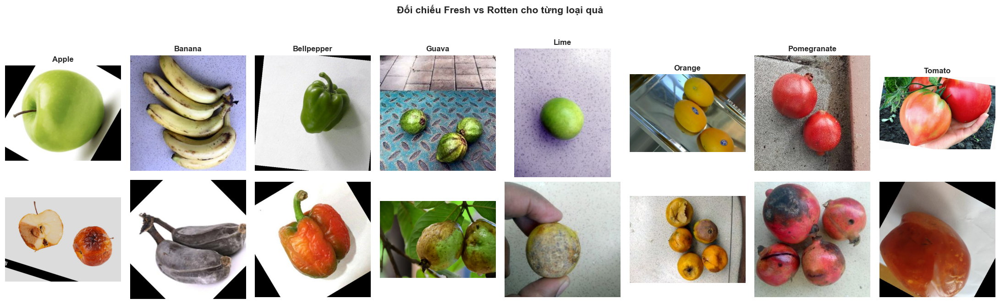

In [15]:
# 5.2 - So sánh Fresh vs Rotten cùng loại quả (8 cặp)
fruits = sorted(df['fruit'].unique())
fig, axes = plt.subplots(2, 8, figsize=(20, 6))
for col, fruit in enumerate(fruits):
    for row, status in enumerate(['Fresh', 'Rotten']):
        cls = f'{fruit}_{status}'
        files = df[df['class'] == cls]['path'].tolist()
        if not files:
            axes[row, col].axis('off'); continue
        chosen = rng_show.choice(files)
        try:
            img = Image.open(chosen).convert('RGB')
            axes[row, col].imshow(img)
        except Exception:
            axes[row, col].text(0.5, 0.5, 'err', ha='center', transform=axes[row, col].transAxes)
        axes[row, col].axis('off')
        if row == 0:
            axes[row, col].set_title(fruit, fontsize=11, fontweight='bold')
    axes[0, 0].set_ylabel('Fresh', fontsize=12, fontweight='bold', color='#2e7d32')
    axes[1, 0].set_ylabel('Rotten', fontsize=12, fontweight='bold', color='#c62828')
plt.suptitle('Đối chiếu Fresh vs Rotten cho từng loại quả',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_fresh_vs_rotten_pairs.png', bbox_inches='tight')
plt.show()

## 6. Image Quality & Cleaning Analysis

Crawler đã filter cơ bản (broken/tiny/duplicate), nhưng dataset vẫn có thể chứa:
- **Blurry images**: ảnh out-of-focus, motion blur — model học pattern blur không phải pattern quả.
- **Low-contrast images**: chụp trong điều kiện ánh sáng kém — ảnh không phân biệt được màu.
- **Near-duplicates**: ảnh gần giống nhau (cùng đối tượng, góc khác) — pHash threshold lỏng có thể bỏ sót.

**Phương pháp phát hiện blur**: **Variance of Laplacian** (Pech-Pacheco et al., 2000):
- Áp Laplacian filter (3×3 second-order derivative) lên grayscale image.
- Tính variance của response.
- Variance thấp = ảnh blur (Laplacian không bắt được edge); variance cao = ảnh sắc nét.
- Threshold tham khảo: variance < 100 → blurry (nhưng phụ thuộc resolution & domain).

$$\text{blur\_score} = \text{Var}(\nabla^2 I_{\text{gray}})$$

In [16]:
# 6.1 - Tính variance of Laplacian cho subsample (toàn bộ sẽ chậm với 12k ảnh)
import cv2

def compute_blur_score(path: str) -> float | None:
    """Variance of Laplacian — proxy độ nét."""
    try:
        data = np.fromfile(str(path), dtype=np.uint8)
        if data.size == 0:
            return None
        img = cv2.imdecode(data, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None
        return float(cv2.Laplacian(img, cv2.CV_64F).var())
    except Exception:
        return None

# Sample 1500 ảnh (random) để estimate phân bố blur — đủ representative, chạy ~15-30s
blur_sample = df.dropna(subset=['width']).sample(min(1500, len(df)), random_state=42)
blur_scores = [compute_blur_score(p) for p in tqdm(blur_sample['path'].tolist(), desc='Blur scan')]
blur_sample = blur_sample.assign(blur=blur_scores).dropna(subset=['blur'])

BLUR_THRESHOLD = 100.0
n_blurry = (blur_sample['blur'] < BLUR_THRESHOLD).sum()
print(f'Sample {len(blur_sample):,} ảnh — phát hiện {n_blurry} ảnh blurry '
      f'(<{BLUR_THRESHOLD}), {n_blurry/len(blur_sample)*100:.2f}%')
print(f'Blur score — min: {blur_sample["blur"].min():.1f}  '
      f'median: {blur_sample["blur"].median():.1f}  max: {blur_sample["blur"].max():.1f}')

Blur scan: 100%|██████████| 1500/1500 [00:17<00:00, 83.43it/s] 

Sample 1,500 ảnh — phát hiện 254 ảnh blurry (<100.0), 16.93%
Blur score — min: 5.7  median: 278.7  max: 41054.0


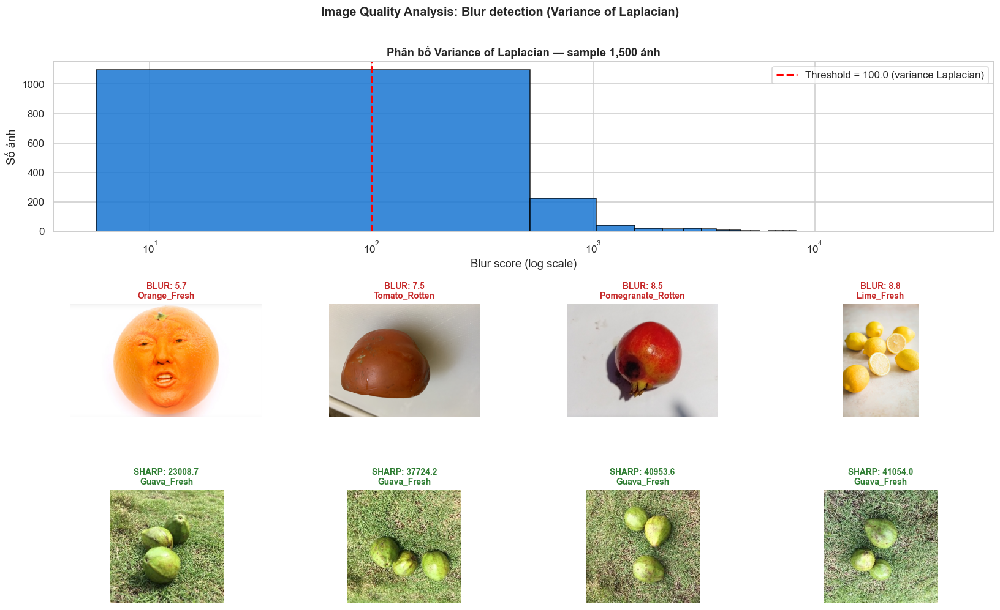

In [17]:
# 6.2 - Visualize: histogram blur score + 4 ảnh blur nhất + 4 ảnh sắc nét nhất
fig = plt.figure(figsize=(15, 9))
gs = fig.add_gridspec(3, 4, height_ratios=[1.5, 1, 1])

ax_hist = fig.add_subplot(gs[0, :])
ax_hist.hist(blur_sample['blur'], bins=80, color='#1976d2', edgecolor='black', alpha=0.85)
ax_hist.axvline(BLUR_THRESHOLD, color='red', ls='--', linewidth=2,
                label=f'Threshold = {BLUR_THRESHOLD} (variance Laplacian)')
ax_hist.set_xscale('log')
ax_hist.set_xlabel('Blur score (log scale)')
ax_hist.set_ylabel('Số ảnh')
ax_hist.set_title(f'Phân bố Variance of Laplacian — sample {len(blur_sample):,} ảnh')
ax_hist.legend()

blur_sample_sorted = blur_sample.sort_values('blur')
blurriest = blur_sample_sorted.head(4)
sharpest  = blur_sample_sorted.tail(4)

for col, (_, row) in enumerate(blurriest.iterrows()):
    ax = fig.add_subplot(gs[1, col])
    try:
        ax.imshow(Image.open(row['path']).convert('RGB'))
    except Exception:
        ax.text(0.5, 0.5, '(error)', ha='center', transform=ax.transAxes)
    ax.set_title(f'BLUR: {row["blur"]:.1f}\n{row["class"]}', fontsize=9, color='#c62828')
    ax.axis('off')

for col, (_, row) in enumerate(sharpest.iterrows()):
    ax = fig.add_subplot(gs[2, col])
    try:
        ax.imshow(Image.open(row['path']).convert('RGB'))
    except Exception:
        ax.text(0.5, 0.5, '(error)', ha='center', transform=ax.transAxes)
    ax.set_title(f'SHARP: {row["blur"]:.1f}\n{row["class"]}', fontsize=9, color='#2e7d32')
    ax.axis('off')

plt.suptitle('Image Quality Analysis: Blur detection (Variance of Laplacian)',
             fontsize=13, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_blur_analysis.png', bbox_inches='tight')
plt.show()

## 7. Preprocessing Pipeline — chuẩn hoá ảnh cho CNN

Trước khi feed vào model, mỗi ảnh phải qua pipeline chuẩn để **đồng nhất shape + range pixel** mà CNN expect:

```
RAW IMAGE                    PREPROCESSED TENSOR
(H, W, 3) varied             (224, 224, 3) float32 in [-1, 1]
RGB / RGBA / Grayscale       RGB only
JPG / PNG / WebP             — (đã decode)
uint8 [0, 255]               float32 ImageNet-preprocessed
```

**Các bước:**

| Bước | Operation | Lý do |
|---|---|---|
| 1 | `convert('RGB')` | CNN expect 3 channel; loại RGBA + Grayscale |
| 2 | `resize((224, 224))` | MobileNetV2/ResNet50 input shape cố định (224×224×3) |
| 3 | `astype('float32')` | Conv ops yêu cầu float, uint8 không tính được gradient |
| 4 | `preprocess_input` (ImageNet stats) | Match phân phối input mà pretrained weights đã học từ ImageNet — **bắt buộc** cho transfer learning |

**Tại sao KHÔNG dùng `image / 255` thông thường?**

Pretrained model (MobileNetV2, ResNet50) được train với input có range cụ thể:
- **MobileNetV2**: `(image / 127.5) - 1.0` → range `[-1, 1]`
- **ResNet50**: `image - [103.94, 116.78, 123.68]` (ImageNet mean BGR) → range `[-123, 152]`

Nếu feed input range `[0, 1]` (rescale 1/255) vào ResNet50 → model **không nhận diện được pattern** → accuracy giảm 30-50%. Đây là lỗi rất phổ biến với người mới làm transfer learning.

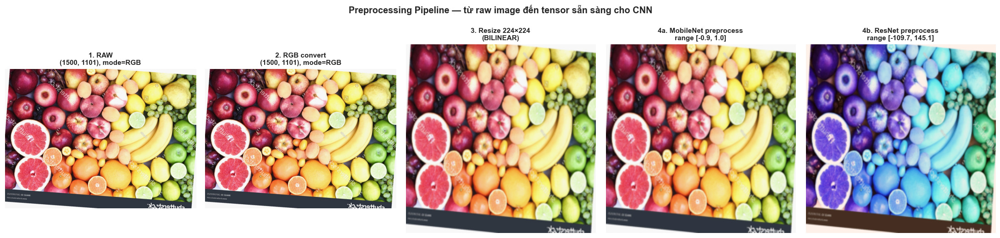

In [18]:
# 7.1 - Visualize preprocessing pipeline cho 1 ảnh đại diện
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mbn_pre
from tensorflow.keras.applications.resnet50 import preprocess_input as rn_pre

demo_path = df[df['class'] == 'Apple_Fresh']['path'].iloc[0]
raw = Image.open(demo_path)
rgb = raw.convert('RGB')
resized = rgb.resize((224, 224), Image.BILINEAR)
arr = np.array(resized).astype('float32')
arr_mbn = mbn_pre(arr.copy())
arr_rn  = rn_pre(arr.copy())

fig, axes = plt.subplots(1, 5, figsize=(20, 4.5))
axes[0].imshow(raw); axes[0].set_title(f'1. RAW\n{raw.size}, mode={raw.mode}', fontsize=10)
axes[1].imshow(rgb); axes[1].set_title(f'2. RGB convert\n{rgb.size}, mode={rgb.mode}', fontsize=10)
axes[2].imshow(resized); axes[2].set_title('3. Resize 224×224\n(BILINEAR)', fontsize=10)
axes[3].imshow((arr_mbn + 1)/2); axes[3].set_title(f'4a. MobileNet preprocess\nrange [{arr_mbn.min():.1f}, {arr_mbn.max():.1f}]', fontsize=10)
axes[4].imshow((arr_rn - arr_rn.min())/(arr_rn.max()-arr_rn.min()))
axes[4].set_title(f'4b. ResNet preprocess\nrange [{arr_rn.min():.1f}, {arr_rn.max():.1f}]', fontsize=10)
for ax in axes: ax.axis('off')
plt.suptitle('Preprocessing Pipeline — từ raw image đến tensor sẵn sàng cho CNN',
             fontsize=13, fontweight='bold', y=1.05)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_preprocessing_pipeline.png', bbox_inches='tight')
plt.show()

## 8. Data Augmentation — tăng generalization

**Vấn đề**: dataset 12k ảnh chia 16 class ≈ 750/class — nhỏ so với chuẩn ImageNet (1.3M ảnh / 1000 class). Train trực tiếp model với capacity lớn (3.5-25M params) sẽ **overfit nặng**.

**Giải pháp Data Augmentation**: tạo **biến thể tổng hợp** trong lúc train mà KHÔNG cần crawl thêm data. Mỗi epoch, ảnh được random transform → model thấy phiên bản hơi khác → học invariance (model coi ảnh táo bị xoay, zoom, đổi sáng vẫn là táo).

**Tác động học thuật**:
- Tương đương regularization → giảm gap train/val accuracy
- Cải thiện robustness với điều kiện thực tế (ánh sáng, góc chụp, kích thước khác nhau)
- Empirically tăng test accuracy 3-8% trên dataset nhỏ

**Augmentation phù hợp cho fruit classification**:

| Augmentation | Range | Tại sao phù hợp |
|---|---|---|
| Rotation | ±25° | Quả có thể được chụp ở bất kỳ góc nào |
| Horizontal flip | True | Quả không có "trái/phải" cố định |
| Zoom | ±20% | Khoảng cách camera khác nhau |
| Brightness | 0.8–1.2× | Ánh sáng đèn vs ánh sáng tự nhiên |
| Width/Height shift | ±15% | Quả không nhất thiết ở giữa khung |
| Shear | ±10% | Méo nhẹ do góc chụp |

**KHÔNG dùng**:
- *Vertical flip*: quả luôn có cuống ở trên — flip dọc tạo ảnh không thực tế.
- *Strong color jitter (hue shift)*: làm mất signal phân biệt fresh/rotten (chính là màu).
- *MixUp/CutMix*: hiệu quả cho dataset rất lớn (>100k); với dataset 12k có thể làm rối model.

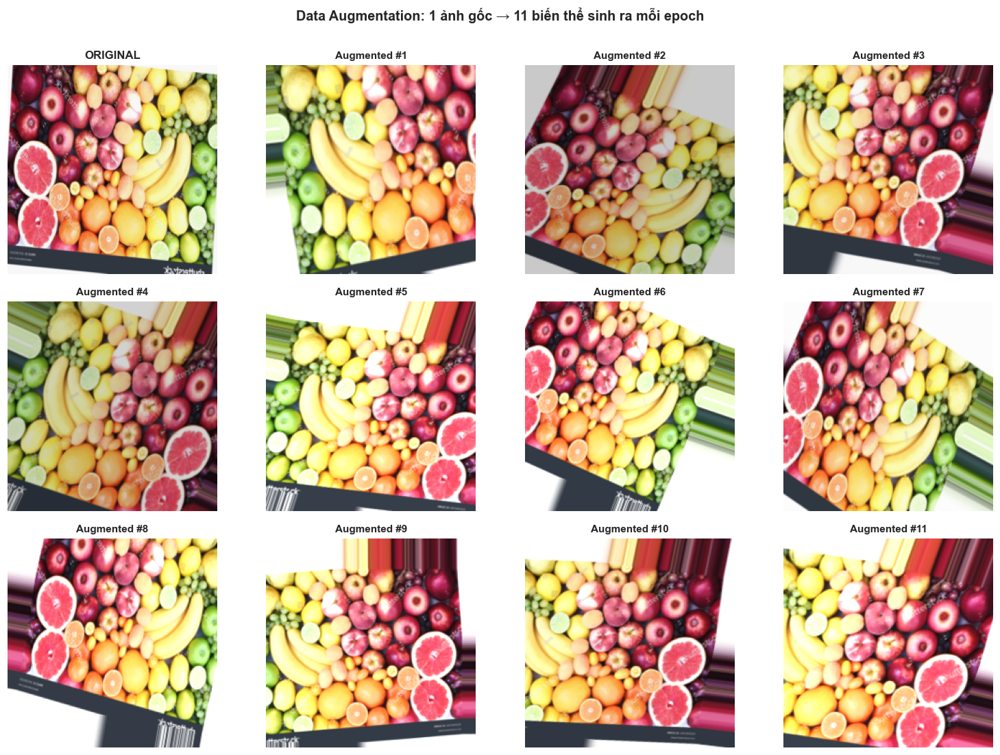

In [19]:
# 8.1 - Visualize augmentation: 1 ảnh gốc + 11 ảnh sau augment
from tensorflow.keras.preprocessing.image import ImageDataGenerator

aug_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=25, width_shift_range=0.15, height_shift_range=0.15,
    shear_range=0.10, zoom_range=0.20,
    brightness_range=(0.8, 1.2), horizontal_flip=True, fill_mode='nearest',
)
demo_arr = np.array(resized.convert('RGB')).astype('float32')[np.newaxis] / 255.0 * 255  # uint8-like
demo_arr = np.array(resized).astype('float32')[np.newaxis]

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
axes[0, 0].imshow(np.array(resized)); axes[0, 0].set_title('ORIGINAL', fontsize=11, fontweight='bold')
axes[0, 0].axis('off')

aug_iter = aug_datagen.flow(demo_arr, batch_size=1, seed=42)
for i, ax in enumerate(axes.ravel()[1:]):
    aug_img = next(aug_iter)[0]
    ax.imshow(np.clip(aug_img, 0, 1))
    ax.set_title(f'Augmented #{i+1}', fontsize=10)
    ax.axis('off')
plt.suptitle('Data Augmentation: 1 ảnh gốc → 11 biến thể sinh ra mỗi epoch',
             fontsize=13, fontweight='bold', y=1.0)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_augmentation_demo.png', bbox_inches='tight')
plt.show()

## 9. Feature Engineering — Trích xuất + Chuẩn hoá + Giảm chiều

Thực hiện đúng yêu cầu Phần 2 của đề bài (lựa chọn đặc trưng → làm sạch → chuẩn hoá → giảm chiều), trực quan hoá từng bước.

### Lý do chọn HSV histogram làm baseline feature

**HSV color space** (Hue, Saturation, Value) tách được:
- **H (hue)**: bước sóng dominant → màu chính của quả (đỏ, vàng, cam...)
- **S (saturation)**: độ tinh khiết → quả tươi sậm bão hoà, quả hỏng nhợt nhạt
- **V (value)**: độ sáng → tách được ảnh chụp dark vs bright

→ HSV phù hợp hơn RGB cho fresh/rotten classification vì pattern quả hỏng = giảm S + thâm V.

**Histogram 8×8×8 = 512-d**: chia mỗi kênh thành 8 bins → 512 features mô tả phân phối màu của ảnh.

### Tại sao CNN không cần HSV histogram?

CNN tự **học features tốt hơn HSV histogram** từ raw pixel:
- Layer đầu: học cạnh, gradient (low-level)
- Layer giữa: học texture, pattern (mid-level)
- Layer cuối: học khái niệm (đốm thâm, vỏ mịn...) (high-level)

→ Phần này chỉ làm **baseline so sánh** + đáp ứng yêu cầu đề bài "trực quan hoá đặc trưng". Khi train CNN ở notebook 02, **không dùng HSV features**.

**Quy trình:**
1. Làm sạch: bỏ ảnh corrupt + min-side < 64 px.
2. Subsample N ảnh / class (mặc định 150) để chạy nhanh, kết quả vẫn đại diện.
3. Trích xuất HSV histogram 512-d.
4. Chuẩn hoá `StandardScaler` (mean=0, std=1) — show before/after.
5. PCA: variance curve + scatter 2D.
6. t-SNE: scatter 2D phi tuyến.
7. Lưu features + scaler ra `dataset/processed/`.

In [20]:
# 9.1 - Làm sạch + chọn subsample (cân bằng cho mỗi class)
MIN_SIDE = 64
PER_CLASS = 150  # đủ để PCA/t-SNE chạy nhanh, vẫn cover đủ class

df_clean = df.dropna(subset=['width','height']).copy()
df_clean['min_side'] = df_clean[['width','height']].min(axis=1)
df_clean = df_clean[df_clean['min_side'] >= MIN_SIDE]

rng = np.random.RandomState(42)
df_sub = (df_clean.groupby('class', group_keys=False)
                  .apply(lambda g: g.sample(min(PER_CLASS, len(g)), random_state=42))
                  .reset_index(drop=True))

print(f'Sau làm sạch  : {len(df_clean):,} / {len(df):,} ảnh '
      f'(loại {len(df)-len(df_clean):,})')
print(f'Subsample EDA : {len(df_sub):,} ảnh ({PER_CLASS}/class × {df_sub["class"].nunique()} class)')
df_sub['class'].value_counts().sort_index()

Sau làm sạch  : 12,786 / 12,786 ảnh (loại 0)
Subsample EDA : 2,400 ảnh (150/class × 16 class)


C:\Users\nvant\AppData\Local\Temp\ipykernel_7712\1310902848.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(min(PER_CLASS, len(g)), random_state=42))


class
Apple_Fresh           150
Apple_Rotten          150
Banana_Fresh          150
Banana_Rotten         150
Bellpepper_Fresh      150
Bellpepper_Rotten     150
Guava_Fresh           150
Guava_Rotten          150
Lime_Fresh            150
Lime_Rotten           150
Orange_Fresh          150
Orange_Rotten         150
Pomegranate_Fresh     150
Pomegranate_Rotten    150
Tomato_Fresh          150
Tomato_Rotten         150
Name: count, dtype: int64

In [21]:
# 5.2 - Trích xuất feature HSV histogram (8x8x8 = 512-d) bằng OpenCV
# Lưu ý: dùng np.fromfile + cv2.imdecode để hỗ trợ Unicode path trên Windows
import cv2

BINS = (8, 8, 8)

def hsv_hist(path, size=128):
    """Đọc ảnh -> resize -> HSV -> L1-normalized 3D histogram (flatten 512-d)."""
    try:
        data = np.fromfile(str(path), dtype=np.uint8)
    except OSError:
        return None
    if data.size == 0:
        return None
    img = cv2.imdecode(data, cv2.IMREAD_COLOR)
    if img is None:
        return None
    img = cv2.resize(img, (size, size), interpolation=cv2.INTER_AREA)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([img], [0,1,2], None, BINS,
                        [0,180, 0,256, 0,256]).flatten().astype(np.float32)
    # L1 normalize -> probability distribution (tổng=1)
    hist /= (hist.sum() + 1e-8)
    return hist

feats, labels, kept_paths = [], [], []
for path, cls in tqdm(zip(df_sub['path'].tolist(), df_sub['class'].tolist()),
                       total=len(df_sub), desc='HSV hist'):
    v = hsv_hist(path)
    if v is not None:
        feats.append(v); labels.append(cls); kept_paths.append(path)

X = np.vstack(feats)
y = np.array(labels)
print(f'X shape: {X.shape}  (n_samples × n_features)')
print(f'y shape: {y.shape}  | {len(set(y))} class')

HSV hist: 100%|██████████| 2400/2400 [00:26<00:00, 90.30it/s] 

X shape: (2400, 512)  (n_samples × n_features)
y shape: (2400,)  | 16 class


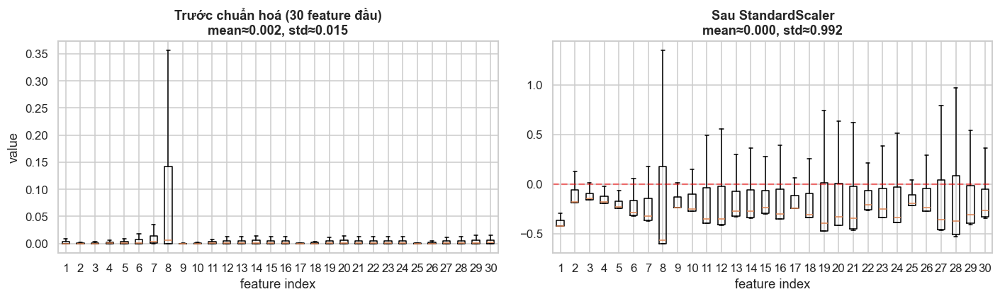

In [22]:
# 5.3 - Chuẩn hoá StandardScaler — visualize before/after
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].boxplot(X[:, :30], showfliers=False)
axes[0].set_title(f'Trước chuẩn hoá (30 feature đầu)\nmean≈{X.mean():.3f}, std≈{X.std():.3f}')
axes[0].set_xlabel('feature index'); axes[0].set_ylabel('value')

axes[1].boxplot(X_scaled[:, :30], showfliers=False)
axes[1].set_title(f'Sau StandardScaler\nmean≈{X_scaled.mean():.3f}, std≈{X_scaled.std():.3f}')
axes[1].set_xlabel('feature index')
axes[1].axhline(0, color='red', ls='--', alpha=0.5)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_feat_scale_before_after.png', bbox_inches='tight')
plt.show()

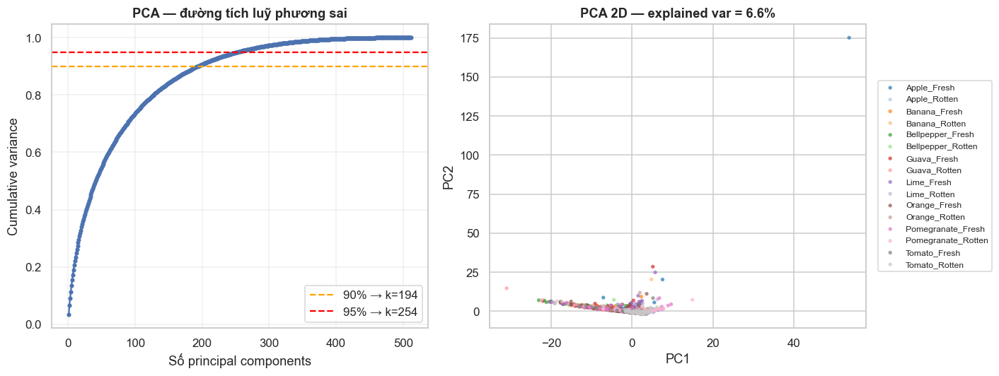

Cần 194 PC để giữ 90% variance, 254 PC để giữ 95%.


In [23]:
# 5.4 - PCA: variance explained curve + scatter 2D
from sklearn.decomposition import PCA

n_max = min(X_scaled.shape[0], X_scaled.shape[1])
pca_full = PCA(n_components=n_max).fit(X_scaled)
cum = np.cumsum(pca_full.explained_variance_ratio_)

def first_k(cum, thr):
    idx = np.where(cum >= thr)[0]
    return int(idx[0]) + 1 if idx.size else None

k90 = first_k(cum, 0.90)
k95 = first_k(cum, 0.95)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
ax = axes[0]
ax.plot(np.arange(1, len(cum)+1), cum, marker='o', ms=3)
ax.axhline(0.90, color='orange', ls='--', label=f'90% → k={k90}')
ax.axhline(0.95, color='red',    ls='--', label=f'95% → k={k95}')
ax.set_xlabel('Số principal components'); ax.set_ylabel('Cumulative variance')
ax.set_title('PCA — đường tích luỹ phương sai'); ax.legend(); ax.grid(alpha=0.3)

pca2 = PCA(n_components=2, random_state=42).fit_transform(X_scaled)
ax = axes[1]
classes = sorted(set(y))
palette = sns.color_palette('tab20', len(classes))
for c, color in zip(classes, palette):
    m = (y == c)
    ax.scatter(pca2[m,0], pca2[m,1], s=12, alpha=0.7, color=color, label=c, edgecolors='none')
ax.set_title(f'PCA 2D — explained var = '
             f'{pca_full.explained_variance_ratio_[:2].sum()*100:.1f}%')
ax.set_xlabel('PC1'); ax.set_ylabel('PC2')
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=8, ncol=1)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_pca.png', bbox_inches='tight')
plt.show()

print(f'Cần {k90} PC để giữ 90% variance, {k95} PC để giữ 95%.')

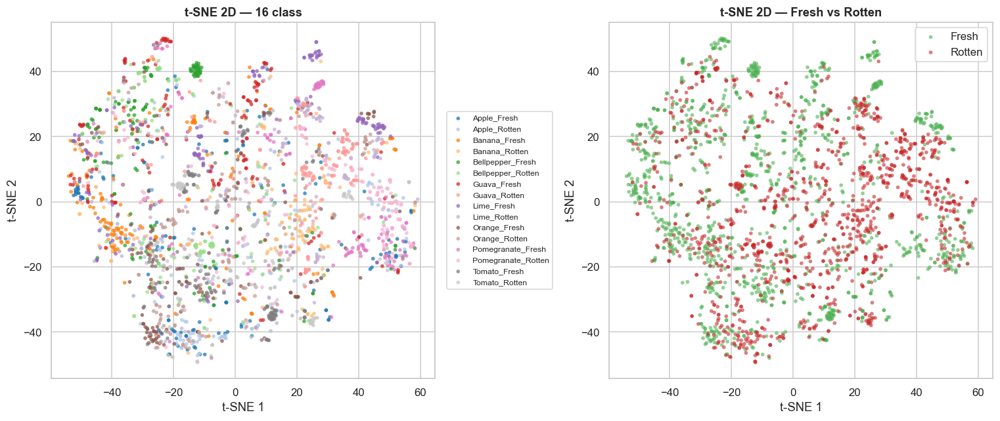

In [24]:
# 5.5 - t-SNE 2D (chạy trên PCA-50 cho nhanh + ổn định hơn)
from sklearn.manifold import TSNE

X_pca50 = PCA(n_components=min(50, X_scaled.shape[1]), random_state=42).fit_transform(X_scaled)
tsne = TSNE(n_components=2, perplexity=30, learning_rate='auto',
            init='pca', random_state=42, n_iter=1000).fit_transform(X_pca50)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
ax = axes[0]
for c, color in zip(classes, palette):
    m = (y == c)
    ax.scatter(tsne[m,0], tsne[m,1], s=14, alpha=0.75, color=color, label=c, edgecolors='none')
ax.set_title('t-SNE 2D — 16 class'); ax.set_xlabel('t-SNE 1'); ax.set_ylabel('t-SNE 2')
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=8)

# Tô theo Fresh/Rotten cho dễ thấy phân tách binary
ax = axes[1]
y_status = np.array(['Fresh' if c.endswith('_Fresh') else 'Rotten' for c in y])
for s, color in zip(['Fresh','Rotten'], ['#4caf50','#c62828']):
    m = (y_status == s)
    ax.scatter(tsne[m,0], tsne[m,1], s=14, alpha=0.6, color=color, label=s, edgecolors='none')
ax.set_title('t-SNE 2D — Fresh vs Rotten'); ax.set_xlabel('t-SNE 1'); ax.set_ylabel('t-SNE 2')
ax.legend()
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_tsne.png', bbox_inches='tight')
plt.show()

In [25]:
# 5.6 - Lưu features + scaler để dùng cho bước train (train baseline với HSV+SVM/LogReg)
import joblib

PROC_DIR = PROJECT_DIR / 'dataset' / 'processed'
PROC_DIR.mkdir(parents=True, exist_ok=True)

np.save(PROC_DIR / 'features_hsv.npy', X)
np.save(PROC_DIR / 'features_hsv_scaled.npy', X_scaled)
np.save(PROC_DIR / 'labels.npy', y)
joblib.dump(scaler, PROC_DIR / 'scaler.joblib')
pd.DataFrame({'path': kept_paths, 'class': y}).to_csv(PROC_DIR / 'feature_index.csv', index=False)

print(f'Đã lưu vào {PROC_DIR}:')
for f in sorted(PROC_DIR.iterdir()):
    print(f'  - {f.name:<28} ({f.stat().st_size/1024:,.1f} KB)')

Đã lưu vào d:\Khoa học dữ liệu\project\dataset\processed:
  - feature_index.csv            (225.9 KB)
  - features_hsv.npy             (4,800.1 KB)
  - features_hsv_scaled.npy      (4,800.1 KB)
  - labels.npy                   (168.9 KB)
  - scaler.joblib                (12.6 KB)


## 10. Final Dataset Summary & Train/Val/Test Split Plan

Tổng hợp số liệu cuối cùng + kế hoạch chia tập theo **stratified split 70/15/15**:

- **Train (70%)**: model học pattern, gradient descent update weights, có augmentation
- **Validation (15%)**: monitor mỗi epoch, chọn checkpoint tốt nhất, EarlyStopping/ReduceLR
- **Test (15%)**: đánh giá cuối — model **chưa bao giờ thấy** → đo accuracy thật

**Stratified split** = mỗi class chia đều 70/15/15 (không random toàn cục) — tránh trường hợp test set thiếu class nào đó.

In [26]:
# 10.1 - Bảng tổng hợp số ảnh + plan split 70/15/15
summary_table = (df.groupby(['fruit', 'status']).size()
                   .unstack(fill_value=0)
                   [['Fresh', 'Rotten']])
summary_table['Total'] = summary_table.sum(axis=1)
summary_table['Train (70%)']  = (summary_table['Total'] * 0.70).astype(int)
summary_table['Valid (15%)']  = (summary_table['Total'] * 0.15).astype(int)
summary_table['Test (15%)']   = summary_table['Total'] - summary_table['Train (70%)'] - summary_table['Valid (15%)']
summary_table.loc['TOTAL']    = summary_table.sum()

print('=== Final Dataset Summary ===')
display(summary_table)
summary_table.to_csv(RESULTS_DIR / 'eda_dataset_summary.csv')
print(f'\nĐã lưu -> {RESULTS_DIR / "eda_dataset_summary.csv"}')

=== Final Dataset Summary ===


status,Fresh,Rotten,Total,Train (70%),Valid (15%),Test (15%)
fruit,,,,,,
Apple,801,779,1580,1106,237,237
Banana,810,843,1653,1157,247,249
Bellpepper,766,769,1535,1074,230,231
Guava,865,828,1693,1185,253,255
Lime,772,806,1578,1104,236,238
Orange,834,767,1601,1120,240,241
Pomegranate,824,787,1611,1127,241,243
Tomato,764,771,1535,1074,230,231
TOTAL,6436,6350,12786,8947,1914,1925



Đã lưu -> d:\Khoa học dữ liệu\project\results\eda_dataset_summary.csv


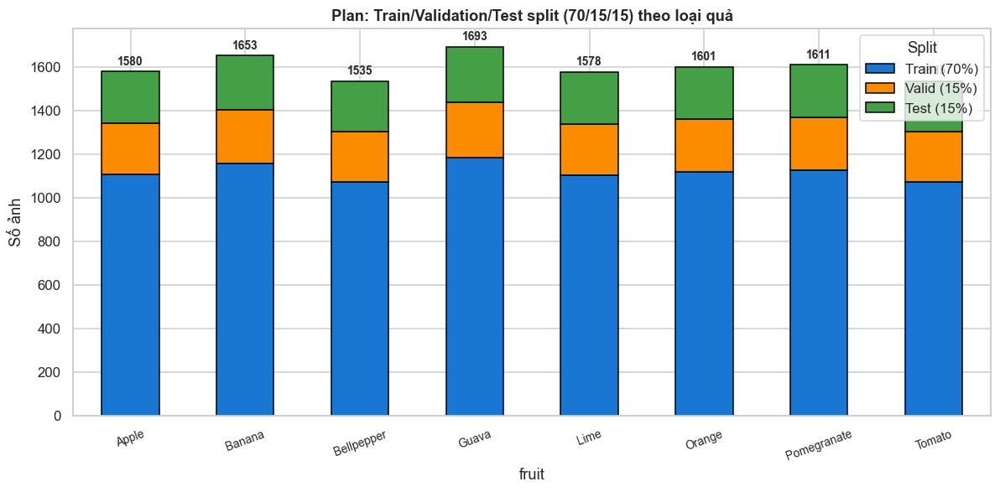

In [27]:
# 10.2 - Visualize split plan: stacked bar Train/Valid/Test theo class
split_data = summary_table.drop('TOTAL')[['Train (70%)', 'Valid (15%)', 'Test (15%)']]
fig, ax = plt.subplots(figsize=(11, 5.5))
split_data.plot(kind='bar', stacked=True, ax=ax,
                color=['#1976d2', '#fb8c00', '#43a047'], edgecolor='black')
ax.set_title('Plan: Train/Validation/Test split (70/15/15) theo loại quả',
             fontweight='bold')
ax.set_ylabel('Số ảnh')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20, fontsize=9)
ax.legend(title='Split', loc='upper right')
for i, total in enumerate(split_data.sum(axis=1)):
    ax.text(i, total + 30, f'{int(total)}', ha='center', fontsize=9, fontweight='bold')
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'eda_split_plan.png', bbox_inches='tight')
plt.show()

In [28]:
# 10.3 - Export Cleaning Report
n_total = len(df)
n_corrupt = df.width.isna().sum()
n_blurry_pct = (n_blurry / len(blur_sample)) * 100 if 'blur_sample' in dir() else None
fmt_dist = df['format'].value_counts().to_dict()
size_stats = {
    'mean_width':  float(df_sz['width'].mean()),
    'mean_height': float(df_sz['height'].mean()),
    'pct_below_224': float((df_sz['min_side'] < 224).mean() * 100),
}

import json
report = {
    'dataset_total':     int(n_total),
    'classes':           int(df['class'].nunique()),
    'corrupt_images':    int(n_corrupt),
    'imbalance_ratio':   float(class_counts.max() / class_counts.min()),
    'blurry_pct_sample': round(n_blurry_pct, 2) if n_blurry_pct is not None else None,
    'format_dist':       {k: int(v) for k, v in fmt_dist.items()},
    'size_stats':        {k: round(v, 1) for k, v in size_stats.items()},
    'split_plan':        {'train': 0.70, 'valid': 0.15, 'test': 0.15},
    'preprocessing':     {
        'target_size': '224x224',
        'color_mode':  'RGB',
        'normalization_mobilenet': 'preprocess_input → [-1, 1]',
        'normalization_resnet':    'preprocess_input → ImageNet centered',
    },
    'augmentation': {
        'rotation_range': 25,
        'width_shift':    0.15,
        'height_shift':   0.15,
        'shear':          0.10,
        'zoom':           0.20,
        'brightness':     [0.8, 1.2],
        'horizontal_flip': True,
    },
}

report_path = RESULTS_DIR / 'eda_cleaning_report.json'
with open(report_path, 'w', encoding='utf-8') as f:
    json.dump(report, f, indent=2, ensure_ascii=False)
print(f'Saved cleaning report -> {report_path}')
print(json.dumps(report, indent=2, ensure_ascii=False))

Saved cleaning report -> d:\Khoa học dữ liệu\project\results\eda_cleaning_report.json
{
  "dataset_total": 12786,
  "classes": 16,
  "corrupt_images": 0,
  "imbalance_ratio": 1.132198952879581,
  "blurry_pct_sample": 16.93,
  "format_dist": {
    "jpg": 12752,
    "jpeg": 17,
    "png": 17
  },
  "size_stats": {
    "mean_width": 749.3,
    "mean_height": 650.5,
    "pct_below_224": 17.4
  },
  "split_plan": {
    "train": 0.7,
    "valid": 0.15,
    "test": 0.15
  },
  "preprocessing": {
    "target_size": "224x224",
    "color_mode": "RGB",
    "normalization_mobilenet": "preprocess_input → [-1, 1]",
    "normalization_resnet": "preprocess_input → ImageNet centered"
  },
  "augmentation": {
    "rotation_range": 25,
    "width_shift": 0.15,
    "height_shift": 0.15,
    "shear": 0.1,
    "zoom": 0.2,
    "brightness": [
      0.8,
      1.2
    ],
    "horizontal_flip": true
  }
}


## 11. Tổng kết & Artifacts

### Artifacts xuất ra

**Visualizations (`results/eda_*.png`)** — dùng trực tiếp cho báo cáo:

| Section | Files |
|---|---|
| Class balance | `eda_balance_fresh_vs_rotten.png`, `eda_balance_16class.png`, `eda_balance_per_fruit.png`, `eda_heatmap_fruit_status.png` |
| Image size | `eda_size_hist.png`, `eda_size_scatter.png`, `eda_size_box_per_class.png` |
| File format | `eda_format_distribution.png`, `eda_format_by_class.png` |
| **Sample grid** | `eda_sample_grid.png`, `eda_fresh_vs_rotten_pairs.png` |
| **Quality** | `eda_blur_analysis.png` |
| **Preprocessing** | `eda_preprocessing_pipeline.png` |
| **Augmentation** | `eda_augmentation_demo.png` |
| Feature engineering | `eda_feat_scale_before_after.png`, `eda_pca.png`, `eda_tsne.png` |
| **Split plan** | `eda_split_plan.png` |

**Reports & metadata**:
- `results/eda_metadata.csv` — metadata toàn bộ ảnh (path, class, format, size...)
- `results/eda_dataset_summary.csv` — bảng tổng hợp 16 class + split plan
- `results/eda_cleaning_report.json` — JSON đầy đủ cleaning stats + preprocessing config

**Features (baseline classic ML — không bắt buộc dùng cho CNN)**:
- `dataset/processed/features_hsv.npy`, `features_hsv_scaled.npy`, `labels.npy`, `scaler.joblib`, `feature_index.csv`

### Yêu cầu đề bài đã đáp ứng

| Yêu cầu | Section thực hiện | Trạng thái |
|---|---|---|
| **Phần 1** — >10k ảnh tự crawl, dẫn nguồn | Section 1.1 (Crawling Pipeline) | ✅ |
| **Phần 1** — Thống kê mô tả trực quan | Section 2-4 (4+3+2 plots) | ✅ |
| **Phần 2** — Lựa chọn đặc trưng | Section 9 (HSV histogram) | ✅ |
| **Phần 2** — Làm sạch | Section 6 (blur detection) + crawler clean | ✅ |
| **Phần 2** — Chuẩn hoá | Section 7 + 9.3 (preprocessing + StandardScaler) | ✅ |
| **Phần 2** — Giảm chiều | Section 9.4-9.5 (PCA + t-SNE) | ✅ |
| **Phần 2** — Trực quan hoá từng bước | Mỗi section đều có plot riêng | ✅ |

### Bước tiếp theo

→ Mở **`02_train_v3.ipynb`** để train MobileNetV2 + ResNet50 với data đã chuẩn bị.